In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("C:\\Users\Ahzam Ahmed\\Downloads\\covid_19_clean_complete (2).csv")
data

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.939110,67.709953,22/01/2020,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.153300,20.168300,22/01/2020,0,0,0,0,Europe
2,NaN,Algeria,28.033900,1.659600,22/01/2020,0,0,0,0,Africa
3,NaN,Andorra,42.506300,1.521800,22/01/2020,0,0,0,0,Europe
4,NaN,Angola,-11.202700,17.873900,22/01/2020,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...,...
49063,NaN,Sao Tome and Principe,0.186400,6.613100,27/07/2020,865,14,734,117,Africa
49064,NaN,Yemen,15.552727,48.516388,27/07/2020,1691,483,833,375,Eastern Mediterranean
49065,NaN,Comoros,-11.645500,43.333300,27/07/2020,354,7,328,19,Africa
49066,NaN,Tajikistan,38.861000,71.276100,27/07/2020,7235,60,6028,1147,Europe


#### EDA

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [4]:
data.describe()

,Lat,Long,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
std,24.950320,70.442740,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04
min,-51.796300,-135.000000,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06


In [5]:
data.shape

(49068, 10)

In [6]:
data.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered', 'Active', 'WHO Region'],
      dtype='object')

In [7]:
data.nunique()

Province/State       78
Country/Region      187
Lat                 260
Long                261
Date                188
Confirmed         10861
Deaths             3640
Recovered          7609
Active             8641
WHO Region            6
dtype: int64

In [8]:
data.isnull().sum()

Province/State    34404
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
Active                0
WHO Region            0
dtype: int64

#### Relational Analysis 

In [9]:
corr= data.corr()

<AxesSubplot:>

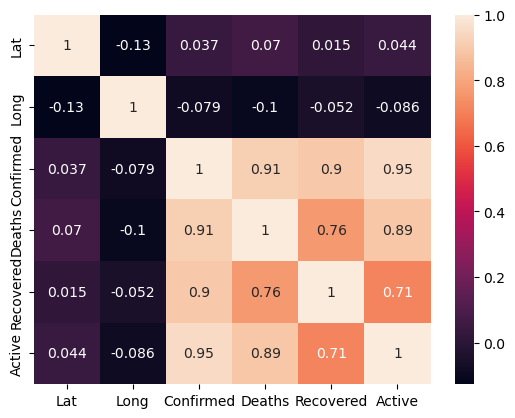

In [10]:
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,annot=True)

In [11]:
data1 = report=data.drop(['Province/State','Country/Region', 'WHO Region'],axis=1)

In [12]:
sum_by_country = data.groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered', 'Active']].sum()
sum_by_country

,Confirmed,Deaths,Recovered,Active
Country/Region,,,,
Afghanistan,1936390,49098,798240,1089052
Albania,196702,5708,118877,72117
Algeria,1179755,77972,755897,345886
Andorra,94404,5423,69074,19907
Angola,22662,1078,6573,15011
...,...,...,...,...
West Bank and Gaza,233461,1370,61124,170967
Western Sahara,901,63,648,190
Yemen,67180,17707,23779,25694


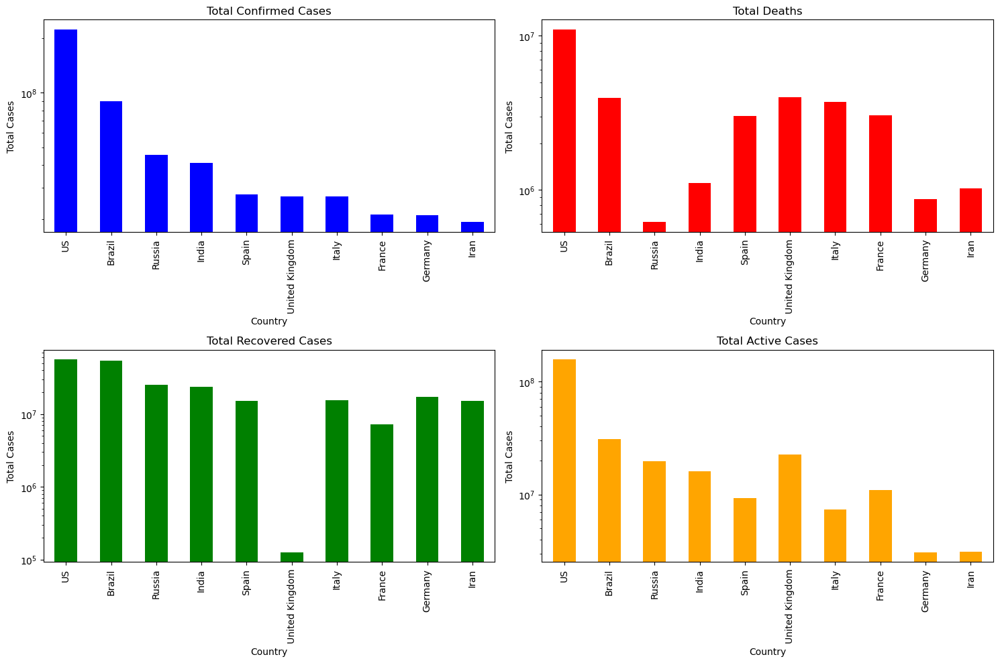

In [13]:
top_countries = sum_by_country.sort_values(by='Confirmed', ascending=False).head(10)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

top_countries['Confirmed'].plot(kind='bar', stacked=True, ax=axes[0, 0], color='blue', logy=True)
axes[0, 0].set_title('Total Confirmed Cases')
axes[0, 0].set_xlabel('Country')
axes[0, 0].set_ylabel('Total Cases')

top_countries['Deaths'].plot(kind='bar', stacked=True, ax=axes[0, 1], color='red', logy=True)
axes[0, 1].set_title('Total Deaths')
axes[0, 1].set_xlabel('Country')
axes[0, 1].set_ylabel('Total Cases')

top_countries['Recovered'].plot(kind='bar', stacked=True, ax=axes[1, 0], color='green', logy=True)
axes[1, 0].set_title('Total Recovered Cases')
axes[1, 0].set_xlabel('Country')
axes[1, 0].set_ylabel('Total Cases')

top_countries['Active'].plot(kind='bar', stacked=True, ax=axes[1, 1], color='orange', logy=True)
axes[1, 1].set_title('Total Active Cases')
axes[1, 1].set_xlabel('Country')
axes[1, 1].set_ylabel('Total Cases')

plt.tight_layout()

plt.show()


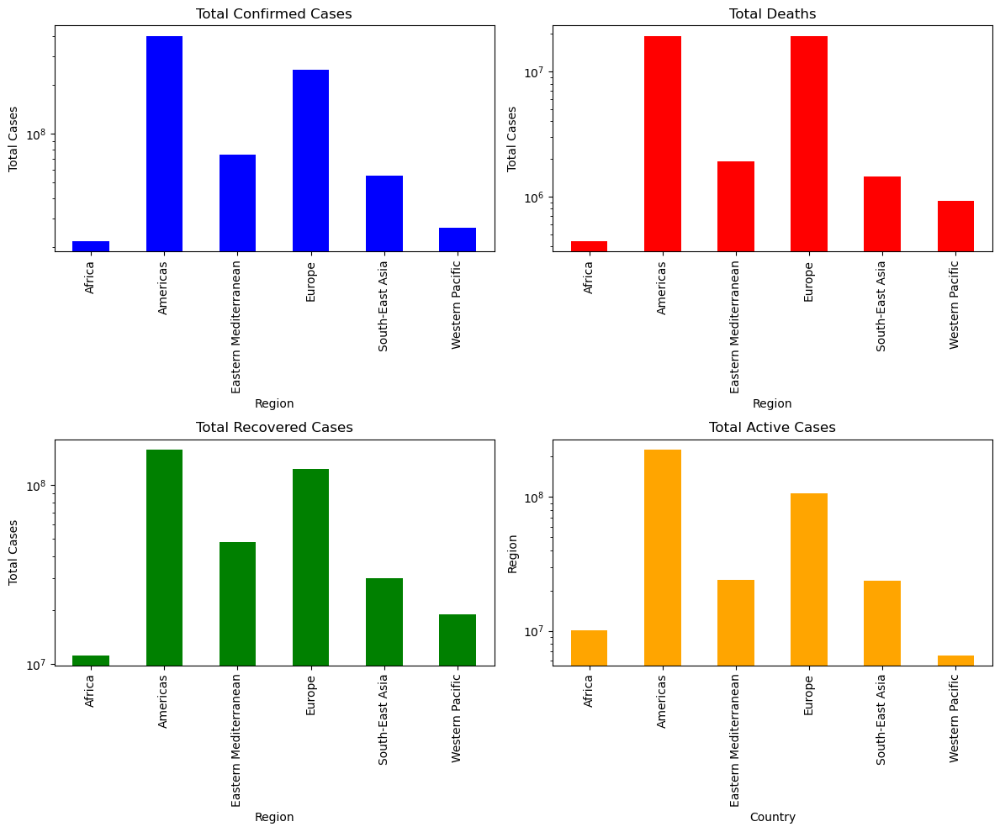

In [14]:
sum_by_region = data.groupby('WHO Region')[['Confirmed', 'Deaths', 'Recovered', 'Active']].sum()
sum_by_region
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

sum_by_region['Confirmed'].plot(kind='bar', stacked=True, ax=axes[0, 0], color='blue', logy=True)
axes[0, 0].set_title('Total Confirmed Cases')
axes[0, 0].set_xlabel('Region')
axes[0, 0].set_ylabel('Total Cases')

sum_by_region['Deaths'].plot(kind='bar', stacked=True, ax=axes[0, 1], color='red', logy=True)
axes[0, 1].set_title('Total Deaths')
axes[0, 1].set_xlabel('Region')
axes[0, 1].set_ylabel('Total Cases')

sum_by_region['Recovered'].plot(kind='bar', stacked=True, ax=axes[1, 0], color='green', logy=True)
axes[1, 0].set_title('Total Recovered Cases')
axes[1, 0].set_xlabel('Region')
axes[1, 0].set_ylabel('Total Cases')

sum_by_region['Active'].plot(kind='bar', stacked=True, ax=axes[1, 1], color='orange', logy=True)
axes[1, 1].set_title('Total Active Cases')
axes[1, 1].set_xlabel('Country')
axes[1, 1].set_ylabel('Region')

plt.tight_layout()

plt.show()


In [15]:
sum_by_date = data.groupby('Date')[['Confirmed', 'Deaths', 'Recovered', 'Active']].sum()
sum_by_date

,Confirmed,Deaths,Recovered,Active
Date,,,,
01/02/2020,12038,259,281,11498
01/03/2020,87690,2990,41208,43492
01/04/2020,947569,50029,189434,708106
01/05/2020,3355922,239881,1026501,2089540
01/06/2020,6280725,376674,2639599,3264452
...,...,...,...,...
30/05/2020,6077978,370718,2509981,3197279
30/06/2020,10449697,511210,5281459,4657028
31/01/2020,9927,213,219,9495


In [16]:
data['Date'] = pd.to_datetime(data['Date'],format='%d/%m/%Y')
data.set_index('Date', inplace=True)
sum_by_month = data.resample('M')[['Confirmed', 'Deaths', 'Recovered', 'Active']].sum()
print("Total Sum by Month:")
print(sum_by_month)

Total Sum by Month:
            Confirmed    Deaths  Recovered     Active
Date                                                 
2020-01-31      38534       889        838      36807
2020-02-29    1663437     46875     363669    1252893
2020-03-31    9002815    397601    2644372    5960842
2020-04-30   63391662   4311214   15944020   43136428
2020-05-31  144990399   9609604   52876838   82503957
2020-06-30  246525787  13309053  116984268  116232466
2020-07-31  362895848  15709667  199594224  147591957


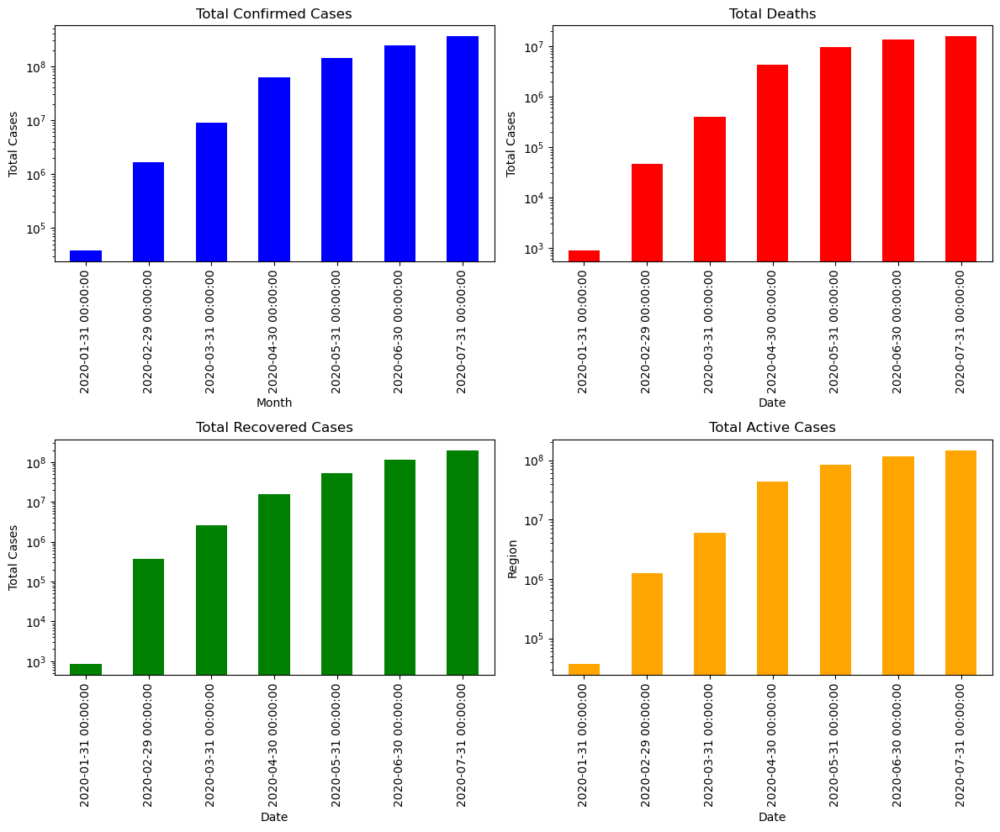

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

sum_by_month['Confirmed'].plot(kind='bar', stacked=True, ax=axes[0, 0], color='blue', logy=True)
axes[0, 0].set_title('Total Confirmed Cases')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Total Cases')

sum_by_month['Deaths'].plot(kind='bar', stacked=True, ax=axes[0, 1], color='red', logy=True)
axes[0, 1].set_title('Total Deaths')
axes[0, 0].set_xlabel('Month')
axes[0, 1].set_ylabel('Total Cases')

sum_by_month['Recovered'].plot(kind='bar', stacked=True, ax=axes[1, 0], color='green', logy=True)
axes[1, 0].set_title('Total Recovered Cases')
axes[0, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Total Cases')

sum_by_month['Active'].plot(kind='bar', stacked=True, ax=axes[1, 1], color='orange', logy=True)
axes[1, 1].set_title('Total Active Cases')
axes[0, 0].set_xlabel('Month')
axes[1, 1].set_ylabel('Region')

plt.tight_layout()

plt.show()

In [18]:
sum_by_week = data.resample('W')[['Confirmed', 'Deaths', 'Recovered', 'Active']].sum()
print("\nTotal Sum by Week:")
print(sum_by_week)


Total Sum by Week:
            Confirmed   Deaths  Recovered    Active
Date                                               
2020-01-26       5702      159        185      5358
2020-02-02      61657     1351       1393     58913
2020-02-09     213727     4547      11344    197836
2020-02-16     400409     9574      45744    345091
2020-02-23     530494    15419     120526    394549
2020-03-01     577672    19704     226523    331445
2020-03-08     689628    23628     362744    303256
2020-03-15     960194    35447     468467    456280
2020-03-22    1771909    73282     590901   1107726
2020-03-29    3827100   178142     845271   2803687
2020-04-05    7211844   394135    1447876   5369833
2020-04-12   11099130   704379    2405175   7989576
2020-04-19   15108893  1038948    3669982  10399963
2020-04-26   19043019  1356933    5104338  12581748
2020-05-03   22903844  1634677    6842870  14426297
2020-05-10   26948124  1888516    8749210  16310398
2020-05-17   31134030  2121066   10851137  1

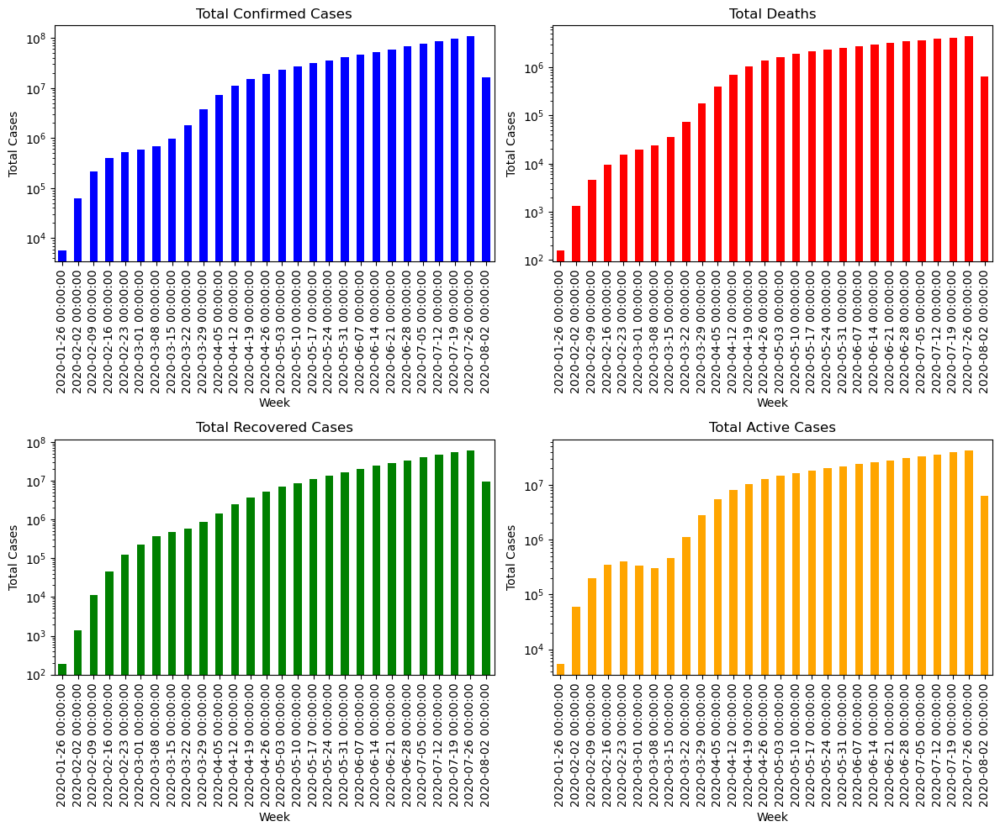

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))


sum_by_week['Confirmed'].plot(kind='bar', stacked=True, ax=axes[0, 0], color='blue', logy=True)
axes[0, 0].set_title('Total Confirmed Cases')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('Total Cases')

sum_by_week['Deaths'].plot(kind='bar', stacked=True, ax=axes[0, 1], color='red', logy=True)
axes[0, 1].set_title('Total Deaths')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Total Cases')

sum_by_week['Recovered'].plot(kind='bar', stacked=True, ax=axes[1, 0], color='green', logy=True)
axes[1, 0].set_title('Total Recovered Cases')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Total Cases')

sum_by_week['Active'].plot(kind='bar', stacked=True, ax=axes[1, 1], color='orange', logy=True)
axes[1, 1].set_title('Total Active Cases')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Total Cases')

plt.tight_layout()

plt.show()



In [20]:
india = data[data['Country/Region']=='India']

In [21]:
india['infection rate'] = india['Confirmed'].diff()

C:\Users\Ahzam Ahmed\AppData\Local\Temp\ipykernel_25044\1254599914.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  india['infection rate'] = india['Confirmed'].diff()


In [22]:
india

,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,WHO Region,infection rate
Date,,,,,,,,,,
2020-01-22,NaN,India,20.593684,78.96288,0,0,0,0,South-East Asia,NaN
2020-01-23,NaN,India,20.593684,78.96288,0,0,0,0,South-East Asia,0.0
2020-01-24,NaN,India,20.593684,78.96288,0,0,0,0,South-East Asia,0.0
2020-01-25,NaN,India,20.593684,78.96288,0,0,0,0,South-East Asia,0.0
2020-01-26,NaN,India,20.593684,78.96288,0,0,0,0,South-East Asia,0.0
...,...,...,...,...,...,...,...,...,...,...
2020-07-23,NaN,India,20.593684,78.96288,1288108,30601,817209,440298,South-East Asia,49310.0
2020-07-24,NaN,India,20.593684,78.96288,1337024,31358,849432,456234,South-East Asia,48916.0
2020-07-25,NaN,India,20.593684,78.96288,1385635,32060,885573,468002,South-East Asia,48611.0


In [23]:
data

,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,WHO Region
Date,,,,,,,,,
2020-01-22,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean
2020-01-22,NaN,Albania,41.153300,20.168300,0,0,0,0,Europe
2020-01-22,NaN,Algeria,28.033900,1.659600,0,0,0,0,Africa
2020-01-22,NaN,Andorra,42.506300,1.521800,0,0,0,0,Europe
2020-01-22,NaN,Angola,-11.202700,17.873900,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...
2020-07-27,NaN,Sao Tome and Principe,0.186400,6.613100,865,14,734,117,Africa
2020-07-27,NaN,Yemen,15.552727,48.516388,1691,483,833,375,Eastern Mediterranean
2020-07-27,NaN,Comoros,-11.645500,43.333300,354,7,328,19,Africa


In [24]:
import pandas as pd

# Assuming your DataFrame is named 'data'
# Replace 'Your_Date_Column_Name' with the actual name of your date column
data.index.name = 'Date'
data.reset_index(inplace=True)


In [25]:
data['Date'] = pd.to_datetime(data['Date'])
grouped_data = data.groupby('Country/Region').apply(lambda x: x.sort_values('Date')).reset_index(drop=True)
data_reset = data.reset_index()
grouped_data
data.reset_index(inplace=True)

In [26]:
grouped_data['infection rate'] = grouped_data['Confirmed'].diff()

In [27]:
grouped_data

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,WHO Region,infection rate
0,2020-01-22,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,NaN
1,2020-01-23,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
2,2020-01-24,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
3,2020-01-25,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
4,2020-01-26,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
...,...,...,...,...,...,...,...,...,...,...,...
49063,2020-07-23,NaN,Zimbabwe,-19.015438,29.154857,2124,28,510,1586,Africa,90.0
49064,2020-07-24,NaN,Zimbabwe,-19.015438,29.154857,2296,32,514,1750,Africa,172.0
49065,2020-07-25,NaN,Zimbabwe,-19.015438,29.154857,2434,34,518,1882,Africa,138.0
49066,2020-07-26,NaN,Zimbabwe,-19.015438,29.154857,2512,34,518,1960,Africa,78.0


In [28]:
grouped_data.fillna(0, inplace=True)

In [29]:
grouped_data

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,WHO Region,infection rate
0,2020-01-22,0,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
1,2020-01-23,0,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
2,2020-01-24,0,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
3,2020-01-25,0,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
4,2020-01-26,0,Afghanistan,33.939110,67.709953,0,0,0,0,Eastern Mediterranean,0.0
...,...,...,...,...,...,...,...,...,...,...,...
49063,2020-07-23,0,Zimbabwe,-19.015438,29.154857,2124,28,510,1586,Africa,90.0
49064,2020-07-24,0,Zimbabwe,-19.015438,29.154857,2296,32,514,1750,Africa,172.0
49065,2020-07-25,0,Zimbabwe,-19.015438,29.154857,2434,34,518,1882,Africa,138.0
49066,2020-07-26,0,Zimbabwe,-19.015438,29.154857,2512,34,518,1960,Africa,78.0


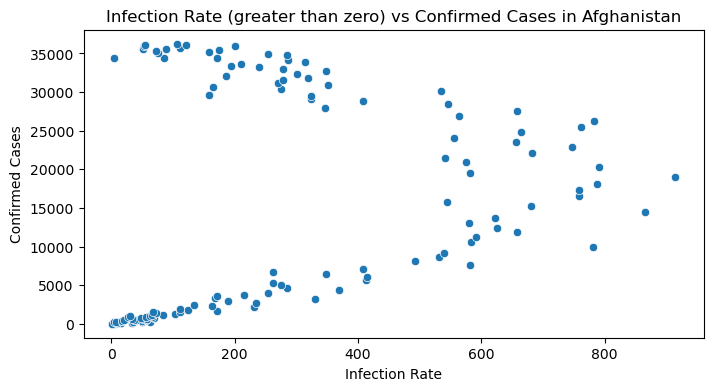

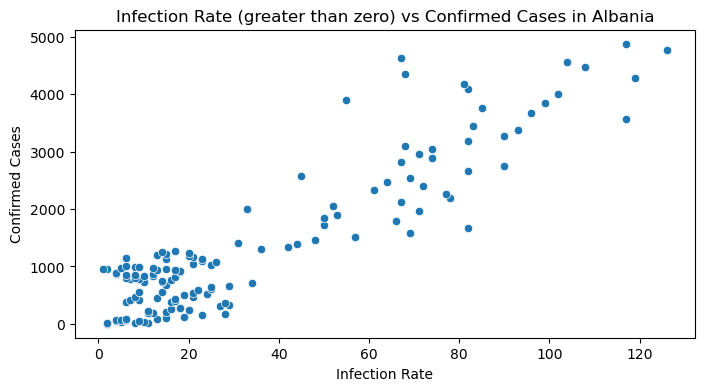

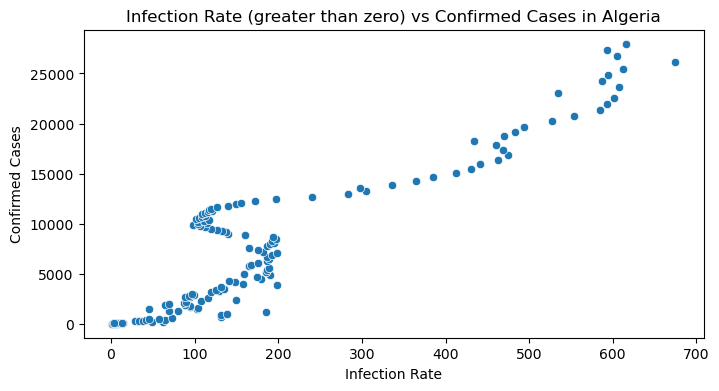

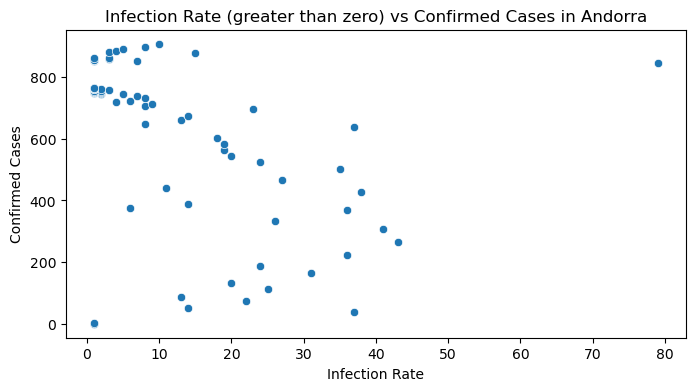

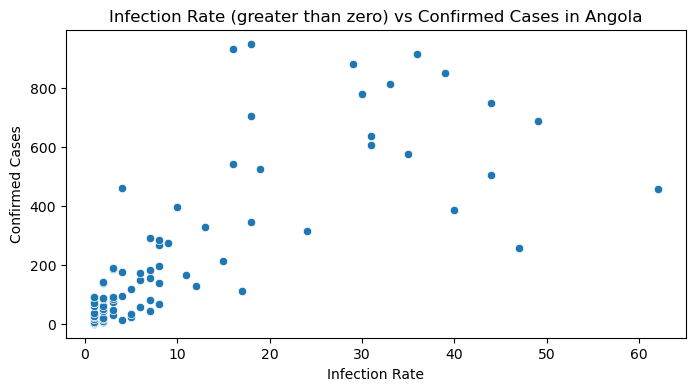

...

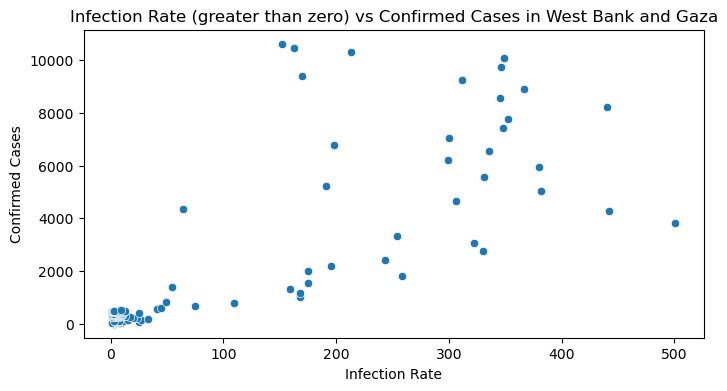

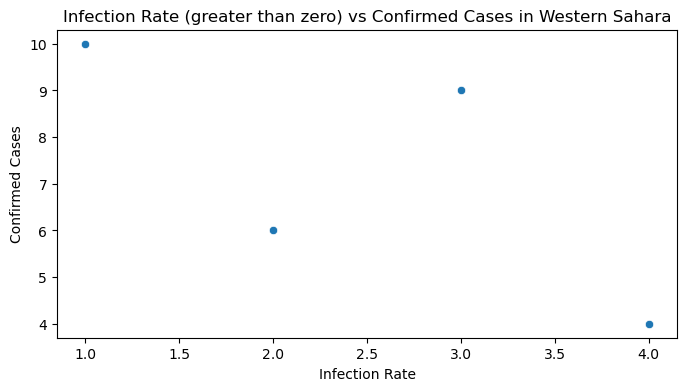

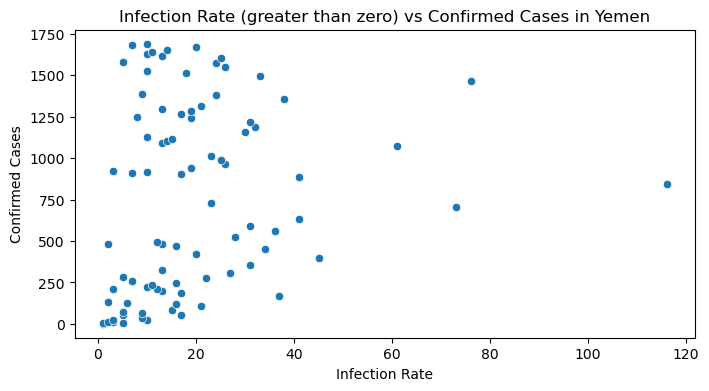

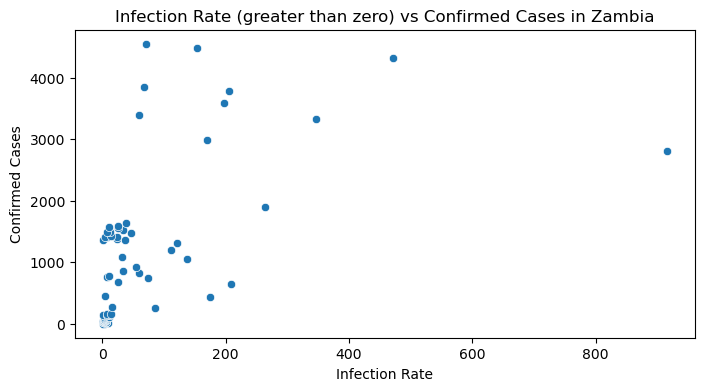

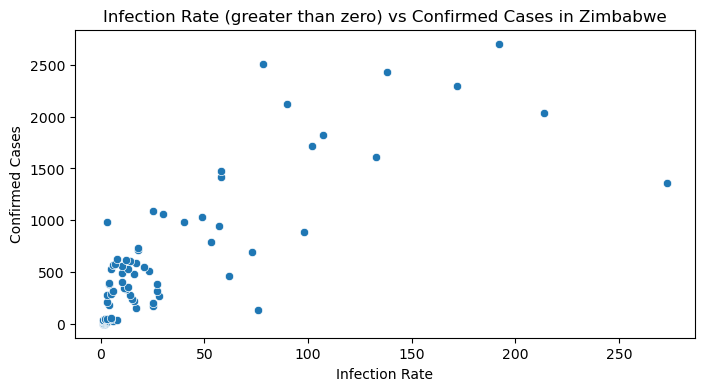

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

for country in grouped_data['Country/Region'].unique():
    country_data = grouped_data[grouped_data['Country/Region'] == country]
    
    plt.figure(figsize=(8, 4))
    filtered_data = country_data[country_data['infection rate'] > 0]
    sns.scatterplot(x='infection rate', y='Confirmed', data=filtered_data)
    
    plt.title(f'Infection Rate (greater than zero) vs Confirmed Cases in {country}')
    plt.xlabel('Infection Rate')
    plt.ylabel('Confirmed Cases')
    plt.show()


In [31]:
total = data.groupby(['Date']).sum().loc[:,['Confirmed','Deaths','Recovered']].reset_index()

total.head()

,Date,Confirmed,Deaths,Recovered
0,2020-01-22,555,17,28
1,2020-01-23,654,18,30
2,2020-01-24,941,26,36
3,2020-01-25,1434,42,39
4,2020-01-26,2118,56,52


In [32]:
import plotly
import plotly.express as px
import plotly.graph_objects as go

In [33]:
country=data.groupby('Country/Region')[['Confirmed','Active','Deaths','Recovered']].sum().reset_index()

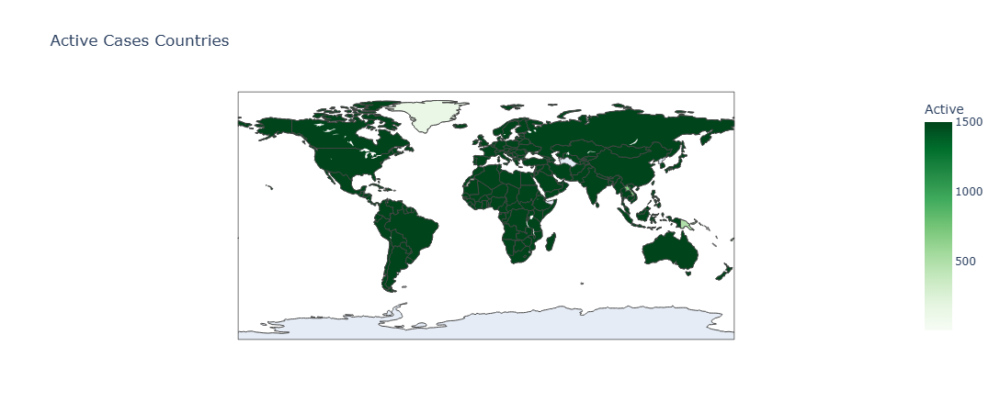

In [34]:
fig=px.choropleth(country,locations='Country/Region',locationmode='country names',color='Active',
                 hover_name='Country/Region',range_color=[1,1500],color_continuous_scale='greens',
                 title='Active Cases Countries')
fig.show()

In [35]:
from prophet import Prophet

Predicting the number of expected or confirmed cases in the future.

In [36]:
data.groupby('Date').sum().head()

,index,Lat,Long,Confirmed,Deaths,Recovered,Active
Date,,,,,,,
2020-01-22,33930,5594.20365,6140.869714,555,17,28,510
2020-01-23,102051,5594.20365,6140.869714,654,18,30,606
2020-01-24,170172,5594.20365,6140.869714,941,26,36,879
2020-01-25,238293,5594.20365,6140.869714,1434,42,39,1353
2020-01-26,306414,5594.20365,6140.869714,2118,56,52,2010


In [37]:
Confirmed=data.groupby('Date')['Confirmed'].sum().reset_index()

In [38]:
Confirmed.columns=['ds','y']
Confirmed.ds=pd.to_datetime(Confirmed['ds'])
Confirmed.tail()

,ds,y
183,2020-07-23,15510481
184,2020-07-24,15791645
185,2020-07-25,16047190
186,2020-07-26,16251796
187,2020-07-27,16480485
